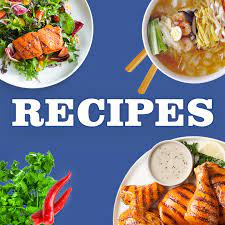 
## Recipe Categorization 
> The goal of the project is to categorize food recipes by using **Unsupervised Natural Language Process** methods, specifically *topic modeling* techniques, into a set of meaningful boundaries. 

### Import Packages

In [1]:
import pickle
import pandas as pd
import string
import re

# nltk.download()
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer, LancasterStemmer

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

### Loading Data
> I used ["Cooking Recipes Dataset"](https://www.kaggle.com/paultimothymooney/recipenlg) found on Kaggle.
- This dataset includes 2M+ recipes. 
- Each recipe follows with a title, direction, link.

In [2]:
df = pd.read_csv("dataset/full_dataset.csv", index_col = 0)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2231142 entries, 0 to 2231141
Data columns (total 6 columns):
 #   Column       Dtype 
---  ------       ----- 
 0   title        object
 1   ingredients  object
 2   directions   object
 3   link         object
 4   source       object
 5   NER          object
dtypes: object(6)
memory usage: 119.2+ MB


In [3]:
# select partial dataset before run the full data
df_sample = df.sample(4000)
df_sample.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4000 entries, 740545 to 683862
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   title        4000 non-null   object
 1   ingredients  4000 non-null   object
 2   directions   4000 non-null   object
 3   link         4000 non-null   object
 4   source       4000 non-null   object
 5   NER          4000 non-null   object
dtypes: object(6)
memory usage: 218.8+ KB


### Text Preprocessing 

In [4]:
df_sample['cleaned_text'] = df_sample['directions'].str.lower()
df_sample['cleaned_text'] = df_sample['cleaned_text'].map(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x))
df_sample['cleaned_text'] = df_sample['cleaned_text'].map(lambda x: re.sub('[\d]+'' x ''[\d]+','', x))
df_sample['cleaned_text'] = df_sample['cleaned_text'].map(lambda x: re.sub('[\d]+','', x))
df_sample['cleaned_text'] = df_sample['cleaned_text'].map(lambda x: re.sub('[\s][u][b]','', x))
df_sample['cleaned_text'] = df_sample['cleaned_text'].map(lambda x: re.sub('[[\s]][FfCc][[\s]','', x)) # remove F and C degree letters
df_sample['cleaned_text'] = df_sample['cleaned_text'].map(lambda x: re.sub('[\s][\d]+[\s][FfCc]','', x))

df_sample['cleaned_text']

/var/folders/g8/dzkrpw492qb61f03tq215ph40000gn/T/ipykernel_41757/3604284576.py:6: FutureWarning: Possible nested set at position 1
  df_sample['cleaned_text'] = df_sample['cleaned_text'].map(lambda x: re.sub('[[\s]][FfCc][[\s]','', x)) # remove F and C degree letters
/var/folders/g8/dzkrpw492qb61f03tq215ph40000gn/T/ipykernel_41757/3604284576.py:6: FutureWarning: Possible nested set at position 13
  df_sample['cleaned_text'] = df_sample['cleaned_text'].map(lambda x: re.sub('[[\s]][FfCc][[\s]','', x)) # remove F and C degree letters


740545     sift dry ingredients  times mix oil and sugar ...
948713     preheat oven to  degrees f  degrees c lightly ...
1307542    preheat oven to  degrees pat filets dry and se...
437127     bring  quarts of lightly salted water to a boi...
529385     combine the lukewarm water  tablespoons sugar ...
                                 ...                        
1250748    preheat the oven tof line two baking pans with...
2219645    heat chocolate butter and coffee over very low...
933873     place tuna steaks and olive oil in a large res...
322787     chop all vegetables mix remaining ingredients ...
683862     beat eggs add oil sugar and zucchini mix well ...
Name: cleaned_text, Length: 4000, dtype: object

In [5]:
# comparision between stemmer and lemmatization 
# stemmer seems too harsh so took lemmatization at this time

porter= PorterStemmer()
lancaster= LancasterStemmer()
wordnet_lemmatizer = WordNetLemmatizer()

porter_stem_list = ['eggs','servings','hours','remaining']

for word in porter_stem_list:
    print("porter stemmer:", word,"->", porter.stem(word))
    print("lancaster stemmer:", word,"->", lancaster.stem(word))
    print("lemmatization:", word,"->", wordnet_lemmatizer.lemmatize(word))
    print("----" * 10)
    

porter stemmer: eggs -> egg
lancaster stemmer: eggs -> eg
lemmatization: eggs -> egg
----------------------------------------
porter stemmer: servings -> serv
lancaster stemmer: servings -> serv
lemmatization: servings -> serving
----------------------------------------
porter stemmer: hours -> hour
lancaster stemmer: hours -> hour
lemmatization: hours -> hour
----------------------------------------
porter stemmer: remaining -> remain
lancaster stemmer: remaining -> remain
lemmatization: remaining -> remaining
----------------------------------------


In [6]:
w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
lemmatizer = nltk.stem.WordNetLemmatizer()

#lemmatize and filter a set of pos_tags
def lemmatize_text(text):
    return[lemmatizer.lemmatize(w) for w in w_tokenizer.tokenize(text)]

df_sample['lemmatized'] = df_sample['cleaned_text'].apply(lemmatize_text)
# df_sample.directions.to_pickle("text_lemmatized.pkl") # save for a later use

df_sample['lemmatized'] = df_sample['lemmatized'].apply(lambda x: " ".join(x))
df_sample['lemmatized']

740545     sift dry ingredient time mix oil and sugar wel...
948713     preheat oven to degree f degree c lightly grea...
1307542    preheat oven to degree pat filet dry and seaso...
437127     bring quart of lightly salted water to a boil ...
529385     combine the lukewarm water tablespoon sugar an...
                                 ...                        
1250748    preheat the oven tof line two baking pan with ...
2219645    heat chocolate butter and coffee over very low...
933873     place tuna steak and olive oil in a large rese...
322787     chop all vegetable mix remaining ingredient to...
683862     beat egg add oil sugar and zucchini mix well s...
Name: lemmatized, Length: 4000, dtype: object

In [7]:
corpus = list(df_sample['lemmatized'])
corpus[:10]

['sift dry ingredient time mix oil and sugar well add dry ingredient add egg pumpkin and nut pour into greased loaf pan bake at for minute make',
 'preheat oven to degree f degree c lightly grease a cookie sheet slice one wheel of brie cheese in half so you have circle of cheese spread apricot or peach preserve on the cut side half of one circle of brie make sandwich out of the two half of brie so that the preserve are in the center of both half wrap the entire wheel of brie with one sheet of puffed pastry and flip the entire concoction onto the prepared cooking sheet so the seam is on bottom brush the puffed pastry with the egg white bake for minute or until the pastry in golden brown serve immediately',
 'preheat oven to degree pat filet dry and season with salt and pepper sear on both side in saute pan with heated oil chill filet covered until cold about hour thinly slice mushroom and in a heavy skillet cook in butter with shallot garlic salt and pepper to taste over moderate heat s

### Base Model (CounterVectorizer and LSA aka SVD)

In [8]:
vectorizer = CountVectorizer(stop_words='english', min_df= 0.1, max_df = 0.8)
doc_word = vectorizer.fit_transform(corpus)
doc_word.shape

(4000, 75)

In [9]:
lsa = TruncatedSVD(5)
doc_topic = lsa.fit_transform(doc_word)
lsa.explained_variance_ratio_

array([0.17323701, 0.08517233, 0.04590592, 0.03690493, 0.03169392])

In [10]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)   

topic_word = pd.DataFrame(lsa.components_.round(3),
             index = ["component_1","component_2", "component_3", "component_4", "component_5"],
             columns = vectorizer.get_feature_names())
topic_word

,add,aside,bake,baking,beat,boil,bowl,bring,brown,butter,cheese,combine,cook,cool,cover,cream,cup,cut,degree,dish,drain,egg,flour,garlic,golden,half,heat,hot,hour,inch,ingredient,juice,just,large,let,lightly,low,make,medium,milk,minute,mix,mixture,oil,onion,oven,pan,pepper,place,pour,preheat,remaining,remove,salt,sauce,saucepan,serve,serving,set,sheet,simmer,skillet,slice,small,smooth,spoon,spread,sprinkle,stir,stirring,sugar,tender,tomato,vanilla,water
component_1,0.416,0.049,0.106,0.096,0.058,0.079,0.174,0.056,0.077,0.115,0.081,0.088,0.176,0.084,0.095,0.077,0.110,0.070,0.039,0.045,0.046,0.110,0.094,0.068,0.039,0.049,0.276,0.051,0.069,0.073,0.061,0.049,0.044,0.113,0.081,0.042,0.045,0.061,0.096,0.053,0.403,0.116,0.169,0.120,0.104,0.131,0.189,0.120,0.133,0.078,0.055,0.076,0.118,0.141,0.094,0.046,0.083,0.040,0.078,0.057,0.061,0.067,0.045,0.065,0.039,0.040,0.035,0.057,0.160,0.072,0.119,0.041,0.049,0.034,0.149
component_2,0.360,-0.016,-0.216,-0.199,-0.140,0.075,-0.232,0.060,-0.003,-0.145,-0.014,-0.094,0.252,-0.131,0.016,-0.116,-0.069,-0.048,-0.055,-0.031,0.047,-0.180,-0.180,0.103,-0.028,-0.025,0.319,0.017,-0.050,-0.120,-0.063,-0.002,-0.023,0.002,-0.044,-0.047,0.023,-0.050,0.030,-0.060,-0.020,-0.136,-0.209,0.128,0.158,-0.191,-0.152,0.161,-0.109,-0.077,-0.090,-0.045,-0.010,0.036,0.095,0.002,0.043,-0.003,-0.049,-0.113,0.096,0.107,-0.026,-0.045,-0.050,-0.028,-0.065,-0.045,0.034,0.056,-0.220,0.061,0.077,-0.087,0.064
component_3,0.687,-0.010,-0.003,-0.040,0.117,-0.021,0.011,-0.034,0.003,0.087,-0.042,-0.027,-0.099,0.001,-0.082,0.133,-0.008,-0.032,-0.050,-0.046,-0.016,0.156,0.126,-0.037,-0.031,-0.021,-0.221,-0.020,0.001,-0.020,0.024,-0.002,-0.012,-0.054,-0.054,-0.026,0.002,0.010,-0.057,0.063,-0.396,0.200,0.076,-0.076,-0.029,-0.146,-0.016,-0.096,-0.170,0.031,-0.057,-0.041,-0.097,-0.025,-0.061,-0.032,-0.033,-0.015,-0.043,-0.053,-0.018,-0.066,-0.061,-0.027,0.012,-0.023,-0.013,-0.057,-0.011,-0.044,0.179,-0.028,-0.029,0.077,0.057
component_4,-0.234,0.028,-0.212,-0.156,0.073,0.160,0.195,0.103,-0.058,0.009,-0.157,0.080,0.037,0.052,0.060,0.079,0.123,-0.062,-0.063,-0.068,0.016,0.073,-0.003,-0.074,-0.028,-0.041,0.374,0.024,0.037,-0.049,-0.057,0.025,0.015,0.043,0.036,-0.015,0.066,0.031,0.143,0.056,-0.255,-0.152,0.295,-0.107,-0.128,-0.209,-0.058,-0.192,-0.081,0.062,-0.086,0.013,0.095,-0.082,-0.012,0.145,-0.025,0.010,0.071,-0.109,0.027,0.013,-0.082,0.092,0.055,0.038,-0.031,-0.077,0.198,0.128,0.162,0.000,-0.084,0.038,0.218
component_5,0.068,-0.048,0.059,-0.071,0.067,0.002,-0.369,0.004,0.012,0.077,-0.172,-0.123,0.090,0.093,-0.081,-0.003,-0.061,-0.067,-0.009,-0.094,-0.082,-0.000,0.016,-0.083,-0.001,-0.106,0.146,-0.027,-0.060,0.041,-0.072,-0.064,-0.005,-0.128,0.009,-0.011,0.015,-0.038,0.000,0.032,0.279,-0.157,-0.088,-0.147,-0.128,0.064,0.549,-0.223,-0.157,0.030,-0.001,-0.085,0.047,-0.169,-0.074,0.001,-0.072,-0.049,-0.045,-0.065,0.011,-0.038,-0.074,-0.103,-0.010,-0.010,-0.013,-0.046,0.044,0.066,0.118,-0.035,-0.109,0.043,-0.173


In [11]:
def display_topics(model, feature_names, no_top_words, topic_names=None):
    for ix, topic in enumerate(model.components_):
        if not topic_names or not topic_names[ix]:
            print("\nTopic ", ix)
        else:
            print("\nTopic: '",topic_names[ix],"'")
        print(", ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))

In [12]:
display_topics(lsa, vectorizer.get_feature_names(), 15)


Topic  0
add, minute, heat, pan, cook, bowl, mixture, stir, water, salt, place, oven, oil, pepper, sugar

Topic  1
add, heat, cook, pepper, onion, oil, skillet, garlic, simmer, sauce, tomato, boil, water, tender, bring

Topic  2
add, mix, sugar, egg, cream, flour, beat, butter, vanilla, mixture, milk, water, pour, ingredient, smooth

Topic  3
heat, mixture, water, stir, bowl, sugar, boil, saucepan, medium, stirring, cup, bring, remove, small, combine

Topic  4
pan, minute, heat, sugar, cool, cook, butter, add, beat, stirring, oven, bake, remove, stir, vanilla


In [13]:
title_per_topic = pd.DataFrame(doc_topic.round(5),
                               index = df_sample.title,
                               columns = ["component_1","component_2","component_3",
                                          "component_4", "component_5"])
title_per_topic.head(25)

,component_1,component_2,component_3,component_4,component_5
title,,,,,
Pumpkin Bread,2.25453,-0.32918,1.50660,-1.03637,0.68386
Brie Cheese Appetizer,1.86268,-1.49733,-1.05700,-1.88953,-0.84089
Mini Beef Wellingtons With Gorgonzola,6.16607,-3.34546,-1.25840,-0.13713,-0.69231
Broccoli With Red Pepper And Shallots(Diabetic),4.20678,1.98224,-0.65845,0.68520,0.35946
Poppy Seed Dough And Fillings,3.10715,-1.31320,1.89442,0.66319,0.48659
Butter Mullu Murukku,2.92687,0.14335,1.03625,1.31153,-1.07622
Israeli Couscous,6.12295,3.42344,1.33962,-0.33384,0.77489
Narsai's Original Chocolate Decadence,6.60887,-4.24868,0.31178,2.64787,3.26401
Zucchini Casserole,1.63363,-0.44844,-0.11258,-0.33388,-0.92314


> Tuning the model (hyperparameters, pos_tags, remove redundant and unnecessary customized words)

In [14]:
# remove redundant or unhelpful words to define topic boundaries by looking the LSA coefficient 
word_list = ['add','minute','aside','baking','place','combine','cover','let','cup','half','inch','ingredient','mix','mixture',
            'make','place','remaining','spoon','serve','serving','set']
for word in word_list:
    df_sample['lemmatized'] = df_sample['lemmatized'].map(lambda x: re.sub(word,'', x))

In [15]:
pd.set_option('display.max_colwidth', None)
from nltk.tag import pos_tag
from nltk.tokenize import word_tokenize

def adj_or_not(text):
    pos_list = pos_tag(word_tokenize(text))
    adjs = ''
    for item in pos_list:
        if item[1] == 'NN' or 'VB':
            adjs = adjs + item[0] + ' '
        elif item[1] == 'JJ':
            adjs = adjs + item[0] + ' '
    return adjs 

df_sample['lemmatized'] = df_sample['lemmatized'].map(adj_or_not)
df_sample['lemmatized'].head()

740545                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  

In [16]:
corpus = list(df_sample['lemmatized'])

vectorizer = CountVectorizer(stop_words='english', min_df= 0.2, max_df = 0.8)
doc_word = vectorizer.fit_transform(corpus)
doc_word.shape

(4000, 24)

In [17]:
lsa = TruncatedSVD(5)
doc_topic = lsa.fit_transform(doc_word)
lsa.explained_variance_ratio_

array([0.20499845, 0.13573896, 0.06674669, 0.05742344, 0.05270338])

In [18]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)   

topic_word = pd.DataFrame(lsa.components_.round(3),
             index = ["component_1","component_2", "component_3", "component_4", "component_5"],
             columns = vectorizer.get_feature_names())
topic_word

,bake,bowl,brown,butter,cook,cool,cream,egg,flour,heat,hour,large,oil,onion,oven,pan,pepper,pour,remove,salt,stir,sugar,ture,water
component_1,0.152,0.271,0.111,0.175,0.251,0.129,0.117,0.172,0.145,0.412,0.105,0.169,0.171,0.145,0.196,0.296,0.167,0.121,0.180,0.205,0.242,0.186,0.271,0.217
component_2,0.229,0.237,-0.006,0.174,-0.351,0.139,0.159,0.224,0.219,-0.480,0.043,-0.036,-0.200,-0.211,0.170,0.170,-0.234,0.082,-0.027,-0.074,-0.071,0.278,0.248,-0.090
component_3,-0.117,0.340,-0.049,0.006,-0.042,-0.043,0.083,0.108,0.076,-0.009,-0.016,0.090,-0.001,0.016,-0.230,-0.780,0.016,-0.027,-0.096,0.091,0.181,0.065,0.302,0.153
component_4,-0.071,-0.361,-0.011,0.142,0.168,0.029,0.175,0.067,-0.060,0.393,-0.072,-0.151,-0.293,-0.164,-0.188,-0.012,-0.366,0.042,-0.007,-0.301,0.264,0.192,0.255,-0.221
component_5,-0.200,0.118,-0.086,-0.187,-0.059,0.051,-0.049,-0.065,-0.028,0.044,0.081,-0.001,-0.093,-0.216,-0.188,0.173,-0.313,0.036,0.137,-0.177,-0.046,0.055,-0.115,0.771


In [19]:
# I removed the necessary but redundant codes to run this cell
display_topics(lsa, vectorizer.get_feature_names(), 15)


Topic  0
heat, pan, ture, bowl, cook, stir, water, salt, oven, sugar, remove, butter, egg, oil, large

Topic  1
sugar, ture, bowl, bake, egg, flour, butter, pan, oven, cream, cool, pour, hour, brown, remove

Topic  2
bowl, ture, stir, water, egg, salt, large, cream, flour, sugar, pepper, onion, butter, oil, heat

Topic  3
heat, stir, ture, sugar, cream, cook, butter, egg, pour, cool, remove, brown, pan, flour, bake

Topic  4
water, pan, remove, bowl, hour, sugar, cool, heat, pour, large, flour, stir, cream, cook, egg


In [20]:
title_per_topic = pd.DataFrame(doc_topic.round(5),
                               index = df_sample.title,
                               columns = ["component_1","component_2","component_3",
                                          "component_4", "component_5"])
title_per_topic.head(25)

,component_1,component_2,component_3,component_4,component_5
title,,,,,
Pumpkin Bread,1.10018,0.78279,-0.75188,-0.07459,-0.09337
Brie Cheese Appetizer,0.63137,0.61570,-0.28808,-0.20298,-0.53826
Mini Beef Wellingtons With Gorgonzola,5.14937,1.80391,0.11855,-1.13344,-1.48654
Broccoli With Red Pepper And Shallots(Diabetic),2.14245,-1.59090,-0.42947,-0.01926,1.42940
Poppy Seed Dough And Fillings,2.10226,1.73025,0.26385,0.29444,0.35386
Butter Mullu Murukku,3.29329,-0.25442,1.12603,-1.14119,1.92939
Israeli Couscous,3.65927,-2.34382,-1.07793,-0.49297,1.27181
Narsai's Original Chocolate Decadence,7.49854,3.85422,-3.02559,1.85311,1.90074
Zucchini Casserole,1.45848,0.37437,0.49248,0.72211,-0.85976


> TF-IDF With NMF
- I will also tune hyperparameter and try trigrams

In [26]:
# remove redundant or unhelpful words to define topic boundaries by looking the LSA coefficient 
word_list = ['remove','stir','water']
for word in word_list:
    df_sample['lemmatized'] = df_sample['lemmatized'].map(lambda x: re.sub(word,'', x))
    
corpus = list(df_sample['lemmatized'])

In [27]:
corpus

['sift dry time oil and sugar well dry egg pumpkin and nut pour into greased loaf pan bake at for ',
 'preheat oven to degree f degree c lightly grease a cookie sheet slice one wheel of brie cheese in so you have circle of cheese spread apricot or peach pre on the cut side of one circle of brie sandwich out of the two of brie so that the pre are in the center of both wrap the entire wheel of brie with one sheet of puffed pastry and flip the entire concoction onto the prepared cooking sheet so the seam is on bottom brush the puffed pastry with the egg white bake for or until the pastry in golden brown immediately ',
 'preheat oven to degree pat fi dry and season with salt and pepper sear on both side in saute pan with heated oil chill fi ed until cold about hour thinly slice mushroom and in a heavy skil cook in butter with shallot garlic salt and pepper to taste over moderate heat ring until mushroom are lightly browned transfer mushroom ture to a bowl to cool compely in a small bowl li

In [30]:

tv = TfidfVectorizer(stop_words='english', min_df = .1, max_df = .9, ngram_range=(1,2))
X = tv.fit_transform(corpus)
tfidf = pd.DataFrame(X.toarray(), columns=tv.get_feature_names())
tfidf

,bake,beat,boil,bowl,bring,brown,butter,cheese,cook,cool,cream,cut,degree,dish,drain,egg,flour,garlic,golden,heat,hot,hour,juice,just,large,large bowl,lightly,low,medium,milk,oil,onion,oven,pan,pepper,pour,preheat,preheat oven,ring,salt,salt pepper,sauce,saucepan,sheet,simmer,skil,slice,small,smooth,spread,sprinkle,sugar,tender,tomato,ture,vanilla
0,0.351494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.439912,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.435808,0.000000,0.000000,0.397241,0.000000,0.416576,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.402076,0.000000,0.000000,0.000000,0.000000
1,0.122778,0.000000,0.000000,0.000000,0.000000,0.160548,0.000000,0.331504,0.000000,0.000000,0.000000,0.171860,0.412167,0.000000,0.000000,0.153663,0.000000,0.000000,0.206386,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.206537,0.000000,0.000000,0.000000,0.000000,0.000000,0.148659,0.000000,0.000000,0.000000,0.177747,0.184131,0.000000,0.000000,0.000000,0.000000,0.000000,0.610277,0.000000,0.000000,0.202279,0.000000,0.000000,0.200047,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.075119,0.118262,0.107704,0.163433,0.000000,0.000000,0.091783,0.000000,0.085506,0.099975,0.000000,0.105149,0.252176,0.000000,0.000000,0.564093,0.000000,0.111437,0.126273,0.079216,0.000000,0.195031,0.000000,0.126088,0.000000,0.000000,0.379097,0.000000,0.000000,0.000000,0.093138,0.000000,0.090954,0.169792,0.182132,0.000000,0.108751,0.112657,0.112657,0.157067,0.227699,0.111500,0.000000,0.124462,0.000000,0.121647,0.123761,0.110377,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.168215,0.000000
3,0.000000,0.000000,0.421039,0.000000,0.225345,0.000000,0.000000,0.000000,0.167132,0.000000,0.000000,0.000000,0.000000,0.225209,0.443755,0.000000,0.000000,0.000000,0.000000,0.309673,0.000000,0.000000,0.000000,0.000000,0.173395,0.000000,0.246997,0.000000,0.199279,0.000000,0.000000,0.000000,0.000000,0.165940,0.178000,0.000000,0.000000,0.000000,0.220202,0.000000,0.000000,0.217941,0.000000,0.000000,0.000000,0.237774,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.240725,0.000000,0.000000,0.000000
4,0.215132,0.338687,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.269248,0.286181,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.317167,0.000000,0.000000,0.000000,0.243132,0.000000,0.000000,0.000000,0.000000,0.000000,0.224910,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.492182,0.000000,0.000000,0.481747,0.000000
5,0.000000,0.000000,0.193183,0.146571,0.000000,0.000000,0.164627,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.716945,0.000000,0.000000,0.284171,0.216014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.334116,0.000000,0.000000,0.000000,0.000000,0.319372,0.000000,0.000000,0.000000,0.140862,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.197978,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.197538,0.000000,0.422899,0.000000,0.000000,0.000000,0.313653,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.408771,0.231596,0.290577,0.220884,0.000000,0.000000,0.000000,0.162703,0.000000,0.000000,0.000000,0.000000,0.000000,0.341649,0.000000,0.000000,0.311415,0.167024,0.000000,0.000000,0.000000,0.000000,0.144038,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.202441,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.071775,0.225993,0.000000,0.000000,0.000000,0.000000,0.263088,0.000000,0.000000,0.000000,0.096479,0.10046

In [45]:
from sklearn.decomposition import NMF

nmf_model = NMF(3)
doc_topic = nmf_model.fit_transform(X)
topic_word

/opt/anaconda3/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "


,bake,beat,boil,bowl,bring,brown,butter,cheese,cook,cool,cream,cut,degree,dish,drain,egg,flour,garlic,golden,heat,hot,hour,juice,just,large,large bowl,lightly,low,medium,milk,oil,onion,oven,pan,pepper,pour,preheat,preheat oven,ring,salt,salt pepper,sauce,saucepan,sheet,simmer,skil,slice,small,smooth,spread,sprinkle,sugar,tender,tomato,ture,vanilla
component_1,1.486,1.251,0.117,0.000,0.046,0.466,1.244,0.000,0.000,0.956,0.909,0.245,0.361,0.120,0.000,1.590,1.404,0.000,0.248,0.150,0.155,0.374,0.000,0.127,0.000,0.000,0.227,0.120,0.105,0.822,0.000,0.000,0.885,1.753,0.000,1.073,0.426,0.444,0.135,0.403,0.000,0.000,0.141,0.522,0.000,0.000,0.000,0.000,0.330,0.302,0.268,1.902,0.000,0.000,0.975,0.936
component_2,0.000,0.000,0.772,0.000,0.614,0.407,0.194,0.000,1.572,0.077,0.000,0.145,0.020,0.037,0.470,0.009,0.000,0.666,0.131,1.853,0.378,0.258,0.204,0.158,0.387,0.000,0.086,0.429,0.572,0.082,0.822,0.964,0.041,0.401,1.023,0.169,0.000,0.000,0.656,0.650,0.548,0.688,0.400,0.000,0.758,0.704,0.098,0.120,0.064,0.000,0.098,0.000,0.570,0.527,0.163,0.000
component_3,0.741,0.000,0.000,0.000,0.000,0.252,0.152,2.435,0.049,0.002,0.795,0.211,0.233,0.949,0.319,0.000,0.000,0.052,0.070,0.000,0.068,0.191,0.000,0.000,0.000,0.000,0.103,0.000,0.000,0.154,0.000,0.490,0.361,0.000,0.202,0.183,0.124,0.113,0.000,0.006,0.059,0.477,0.000,0.083,0.000,0.021,0.451,0.017,0.057,0.635,0.693,0.000,0.044,0.210,0.338,0.000
component_4,0.000,0.000,0.000,2.474,0.000,0.000,0.000,0.000,0.000,0.179,0.000,0.550,0.173,0.055,0.068,0.000,0.125,0.124,0.132,0.000,0.058,0.481,0.764,0.331,1.152,0.973,0.251,0.000,0.263,0.000,0.488,0.000,0.353,0.000,0.227,0.089,0.309,0.256,0.000,0.414,0.160,0.006,0.000,0.341,0.000,0.000,0.386,0.837,0.218,0.030,0.124,0.000,0.000,0.051,0.516,0.000


In [46]:
topic_word = pd.DataFrame(nmf_model.components_.round(3),
             index = ["component_1","component_2","component_3"],
             columns = tv.get_feature_names())

display_topics(nmf_model, tv.get_feature_names(), 10)


Topic  0
sugar, pan, egg, flour, bake, ture, beat, butter, bowl, pour

Topic  1
heat, cook, pepper, onion, oil, salt, boil, simmer, garlic, sauce

Topic  2
cheese, dish, cream, bake, sprinkle, spread, slice, onion, sauce, oven


In [48]:
title_per_topic = pd.DataFrame(doc_topic.round(5),
                               index = df_sample.title,
                               columns = ["component_1","component_2","component_3"])
title_per_topic[0:20]

,component_1,component_2,component_3
title,,,
Pumpkin Bread,0.11570,0.00760,0.00000
Brie Cheese Appetizer,0.04552,0.00000,0.12607
Mini Beef Wellingtons With Gorgonzola,0.10040,0.07684,0.00000
Broccoli With Red Pepper And Shallots(Diabetic),0.00000,0.15800,0.01742
Poppy Seed Dough And Fillings,0.14406,0.00000,0.00000
Butter Mullu Murukku,0.06527,0.06677,0.00000
Israeli Couscous,0.00747,0.16477,0.00000
Narsai's Original Chocolate Decadence,0.14153,0.02509,0.00000
Zucchini Casserole,0.00376,0.03763,0.20778


> Checking each topic to create labels of food categories.

In [49]:
title_per_topic['meal_types'] = title_per_topic.idxmax(axis=1)

In [50]:
title_per_topic[(title_per_topic['meal_types']=='component_1')
                &(title_per_topic['component_2'] == 0)
                &(title_per_topic['component_3'] == 0)
                &(title_per_topic['component_1'] != 0)].sort_values(by =['component_2'], ascending = False)

,component_1,component_2,component_3,meal_types
title,,,,
Poppy Seed Dough And Fillings,0.14406,0.0,0.0,component_1
Banana Drop Cookies,0.13392,0.0,0.0,component_1
Low Cal Chocolate Chunk Cookies,0.12147,0.0,0.0,component_1
Nut Cake,0.12699,0.0,0.0,component_1
Ice Cream Cake Roll,0.15246,0.0,0.0,component_1
Old-Fashioned,0.06923,0.0,0.0,component_1
Prune Cake,0.09821,0.0,0.0,component_1
Oat Horchata Agua Fresca,0.07173,0.0,0.0,component_1
Strawberry Salad,0.05965,0.0,0.0,component_1


In [51]:
title_per_topic[(title_per_topic['meal_types']=='component_2')
                &(title_per_topic['component_1'] == 0)
                &(title_per_topic['component_3'] == 0)
                &(title_per_topic['component_2'] != 0)].sort_values(by =['component_2'], ascending = False)

,component_1,component_2,component_3,meal_types
title,,,,
Skillet Mushrooms and Chard With Barley or Brown Rice,0.0,0.21350,0.0,component_2
Louisiana Dirty Rice,0.0,0.21063,0.0,component_2
Provencal Vegetable Soup,0.0,0.20880,0.0,component_2
Pasta With Kielbasa And Sauerkraut,0.0,0.20587,0.0,component_2
Portuguese Kale Soup,0.0,0.20301,0.0,component_2
Sauteed Cod with Rich Ketchup Sauce,0.0,0.20008,0.0,component_2
Tri-Color Pasta,0.0,0.19928,0.0,component_2
Tri Color Pepper Salad,0.0,0.19860,0.0,component_2
Easy Vegan Chili,0.0,0.19817,0.0,component_2


In [52]:
title_per_topic[(title_per_topic['meal_types']=='component_3')
                &(title_per_topic['component_1'] == 0)
                &(title_per_topic['component_2'] == 0)
                &(title_per_topic['component_3'] != 0)].sort_values(by =['component_3'], ascending = False)

,component_1,component_2,component_3,meal_types
title,,,,
Taco Dip,0.0,0.0,0.27503,component_3
Cheesy Veggie-Potato Casserole,0.0,0.0,0.25599,component_3
Mock-Sou-Berag,0.0,0.0,0.25510,component_3
Baked Chicken Salad,0.0,0.0,0.24375,component_3
Quick Apple Crisp,0.0,0.0,0.24302,component_3
Chicken Casserole Or Hot Chicken Salad,0.0,0.0,0.24069,component_3
Jenna's Chicken Enchiladas,0.0,0.0,0.23910,component_3
Stromboli,0.0,0.0,0.23888,component_3
Taco Burger,0.0,0.0,0.23787,component_3


# Categories of food receipes 

- When the number of topic was three, it seemed it distinguished food types the best, so I would categorize into 3 food types. Those may be desert, something healthy, and something entertaining! 
- if possible, more information would be very helpful such as food origins. 